# Анализ рынка заведений общественного питания Москвы

Для инвестиционного фонда необходимо провести исследование рынка заведений общественного питания Москвы. Необходимо найти особенности закономерности, которые позволять инвесторам определить, какое именно заведение стоит открыть: тип (кафе, ресторан, пиццерия, паб или бар), расположение, меню, цены.

**Цель исследования:** найти особенности рынка заведений общественного питания Москвы, которые позволят определиться с характеристиками нового заведения.

**Задачи:**
1. Провести предобработку данных.
2. Провести первичный анализ данных.
3. Проанализировать данные по категориям заведений (количество заведений; количество посадочных мест).
4. Проанализировать информацию по сетевым заведениям (в соотношении с несетевыми заведениями; по категориям; топ-15 популярных сетей)
5. Провести территориальный анализ (по категориям по районам; по средним рейтингам и по категориям заведений; топ-15 улиц по количеству и категориям; по улицам, на которых находится только один объект общепита; по средним чекам в разрезе округов).
6. Детализировать анализ по кофейням.
7. Подготовить презентацию.

**Описание данных:**

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация из сервиса Яндекс Бизнес добавлена пользователями или найдена в общедоступных источниках и носит исключительно справочный характер.

**Показатели:**

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например, «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например, «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: «Средний счёт: 1000–1500 ₽»; «Цена чашки капучино: 130–220 ₽»; «Цена бокала пива: 400–600 ₽».
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: число (если без диапазона), медиана (если диапазон значений);
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: число (если без диапазона), медиана (если диапазон значений);
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- district — административный район, в котором находится заведение, например, Центральный административный округ;
- seats — количество посадочных мест.

## Изучение общей информации по файлу

In [1]:
import pandas as pd
from datetime import datetime, timedelta
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from numpy import median
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
try:
    data = pd.read_csv('')
except:
    data = pd.read_csv('')

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


**Выводы по разделу:**

1. Всего в датафрейме представлено 8406 заведений, которые в дальнейшем проверим на дубликаты.

2. Типы данных соответствуют содержанию показателей. Но по некоторым будет невозможно делать числовой анализ, поэтому в следующем разделе необходимо будет добавить некоторые столбцы.

3. Не по всем заведениям имеется полная информация. Необходимо будет проанализировать пропуски и определить, как с ними работать.

## Предобработка данных

### Анализ и обработка дубликатов

In [5]:
print('Количество дубликатов:', data.duplicated().sum())

Количество дубликатов: 0


Явные дубликаты отсутствуют. Проанализируем наличие неявных дубликатов.

In [6]:
print('Количество уникальных названий заведений:', data['name'].nunique())
print('Общее количество заведений в датасете:', data.shape[0])

Количество уникальных названий заведений: 5614
Общее количество заведений в датасете: 8406


Посмотрим, есть ли среди заведений с дублируемыми названиями несетевые.

In [7]:
data_duplication = data.query('chain == 0')\
                       .pivot_table(index='name', values='category', aggfunc='count')\
                       .reset_index()
data_duplication.columns = ['name', 'number']

data_duplication[data_duplication['number'] > 1]

,name,number
1770,Бистро,12
1787,Блины,3
1843,Буфет,8
2499,Кафе,189
2595,Кафе для поминок,2
2640,Кафе-кулинария,2
2645,Кафе-столовая,9
2801,Кофейня,12
3536,Пиццерия,3
3585,Поминальные обеды,5


В этот список попали заведения без уникального названия. Чтобы быть уверенными в отсутствии дубликатов, посмотрим на уникальность их расположения.

In [8]:
print('Количество дубликатов по расположению:', data[['name', 'lat', 'lng']].duplicated().sum())

Количество дубликатов по расположению: 0


Можно делать вывод об отсутствии в датасете дубликатов.

### Анализ и обработка пропусков

In [9]:
print('Количество пропущенных значений по столбцам')
data.isna().sum()

Количество пропущенных значений по столбцам


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

По ключевым показателям, позволяющим идентифицировать заведения (название, категория, адрес) информация имеется по полному кругу объектов.  
По режиму работы пропусков немного, поэтому этот показатель тоже можно будет анализировать.  
По ценовым показателям и количеству посадочных мест слишком много пропусков, чтобы их заполнить чем-то без потери качества данных. Тем более, эта информация носит справочных характер и ее достоверность не гарантирована. Поэтому их лучше оставить в таком виде. Просто при анализе будем иметь это ввиду.

### Добавление новых столбцов для анализа

**Столбец с названиями улиц**

In [10]:
data['street'] = data['address'].str.split(', ', expand=True)[1]
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


**Столбец с обозначением ежедневной и круглосуточной работы заведения**

In [11]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


### Вывод по разделу

В результате предобработки:
1. Было подтверждено отсутствие дубликатов.
2. Были выявлены пропуски по ценовым показателям (price, avg_bill, middle_avg_bill, middle_coffee_cup), количеству посадочных мест (3611) и режиму работы заведения (hours). Было принято решение оставить эти показатели без изменений, чтобы не исказить результаты анализа.
3. Был выделен новый столбец с улицами, на которых расположены заведения (street).
4. Был добавлен столбце с идентификатором круглосуточной и ежедневной работы заведения (is_24/7).

## Анализ данных

### Анализ категорий заведений

In [12]:
data_by_category = data.pivot_table(index='category', values='name', aggfunc='count')\
                       .rename({'name':'number'}, axis=1)\
                       .sort_values(by='number', ascending=False)\
                       .reset_index()
data_by_category['percent'] = (data_by_category['number'] / data_by_category['number'].sum())\
                                                                                      .map(lambda x: "{:.1%}".format(x))
data_by_category

,category,number,percent
0,кафе,2378,28.3%
1,ресторан,2043,24.3%
2,кофейня,1413,16.8%
3,"бар,паб",765,9.1%
4,пиццерия,633,7.5%
5,быстрое питание,603,7.2%
6,столовая,315,3.7%
7,булочная,256,3.0%


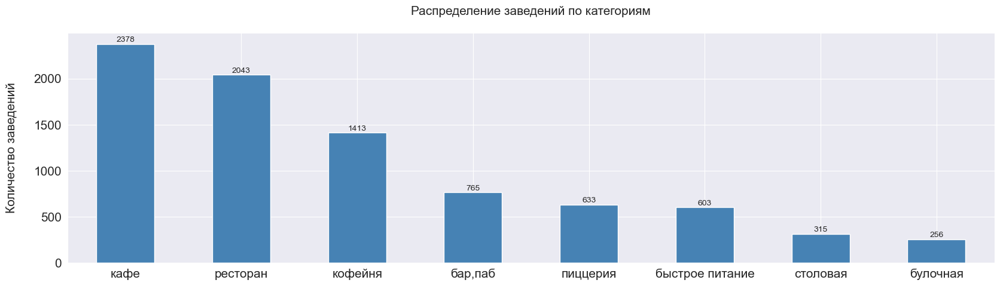

In [13]:
sns.set_style('darkgrid')
def barplot(data, x, y, title, ylable):
    ax = data.plot(kind='bar', figsize=(20, 5), color='steelblue', fontsize=15, rot=0)
    ax.set_title(title, fontsize=15)
    ax.set_xlabel('')
    ax.set_ylabel(ylable, fontsize=15)
    ax.set_xticklabels(x)
    ax.get_legend().remove()

    rects = ax.patches
    labels = [y[i] for i in range(len(rects))]
    for rect, label in zip(rects, labels):
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width() / 2, height + 5, label, ha="center", va="bottom")

    plt.show()

barplot(
        data_by_category,
        data_by_category['category'],
        data_by_category['number'],
        'Распределение заведений по категориям\n',
        'Количество заведений\n'
        )

По таблице и графику видно, что наибольшее количество заведений представлено в категории кафе, ресторан и кофейня. На остальные категории приходится чуть более 30% заведений.

### Анализ посадочных мест по категориям

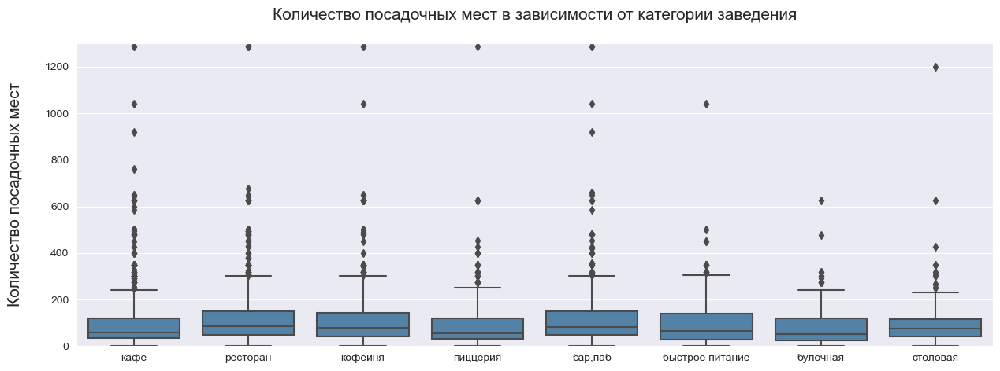

In [14]:
def get_boxplot(data, x, y, title, ylable, ylim1, ylim2):
    plt.figure(figsize=(15, 5))
    ax = sns.boxplot(x=x, y=y, data=data, color='steelblue')
    ax.set_title(title, fontsize=15)
    ax.set_xlabel('')
    ax.set_ylabel(ylable, fontsize=15)
    ax.set_ylim(ylim1, ylim2)
    plt.show()

get_boxplot(data,
            'category',
            'seats',
            'Количество посадочных мест в зависимости от категории заведения\n',
            'Количество посадочных мест\n',
             0,
             1300)

На графике видно, что в категориях кафе, бар, паб, ресторан большее всего выбросов, в которых число посадочных мест превышает 400.
Посмотрим поближе на медианы значений.

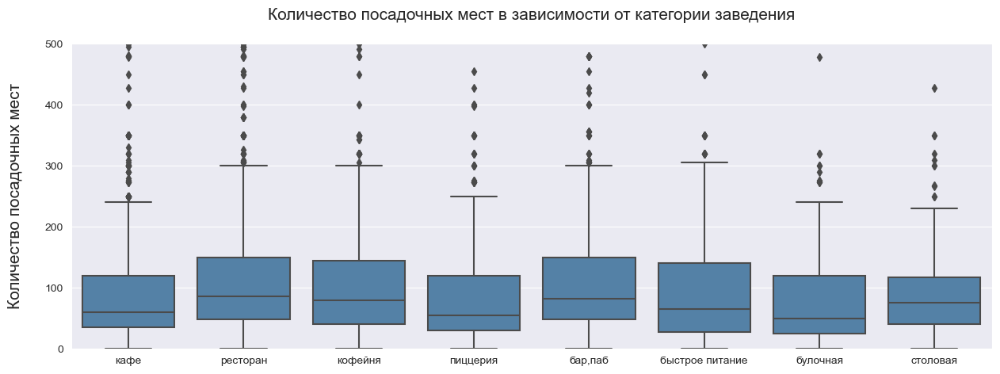

In [15]:
get_boxplot(data,
            'category',
            'seats',
            'Количество посадочных мест в зависимости от категории заведения\n',
            'Количество посадочных мест\n',
             0,
             500)

In [16]:
data.pivot_table(index='category', values='seats', aggfunc=['median', 'count'])\
    .sort_values(by=('median', 'seats'), ascending=False)

,median,count
,seats,seats
category,,
ресторан,86.0,1270
"бар,паб",82.5,468
кофейня,80.0,751
столовая,75.5,164
быстрое питание,65.0,349
кафе,60.0,1218
пиццерия,55.0,427
булочная,50.0,148


Учитывая репрезентативность данных, с уверенностью можно сказать, что в ресторанах в среднем почти на треть больше посадочных мест, чем в кафе. Что достаточно логично, учитывая специфику этих категорий.

### Анализ соотношения сетевых и несетевых заведений

In [17]:
data_by_chain = data.pivot_table(index='chain', values='name', aggfunc='count')
data_by_chain

,name
chain,
0,5201
1,3205


In [18]:
print('Доля сетевых заведений в датасете: {:.2%}'.format(data_by_chain['name'][1]/data_by_chain['name'].sum()))

Доля сетевых заведений в датасете: 38.13%


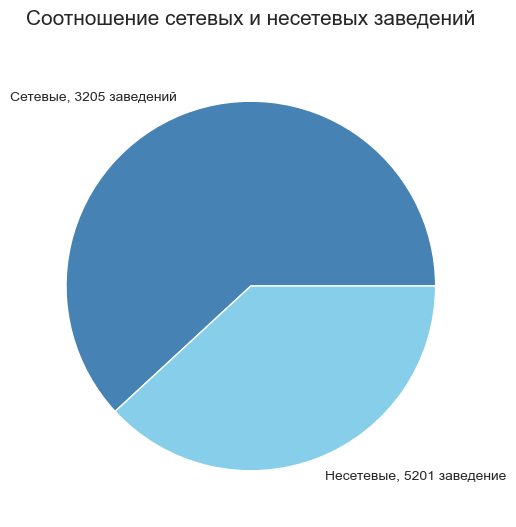

In [19]:
plt.figure(figsize=(6, 6))
ax = plt.pie(data_by_chain['name'],
             labels=[
                     'Сетевые, {} заведений'.format(data_by_chain.loc[1]['name']),
                     'Несетевые, {} заведение'.format(data_by_chain.loc[0]['name'])
                     ],
             colors=['steelblue', 'skyblue'])
plt.title('Соотношение сетевых и несетевых заведений\n', fontsize=15)
plt.show()

По графику видно, что несетевых заведений в датасете больше, чем сетевых.  
Посмотрим, какие категории заведений чаще являются сетевыми.

### Распределение сетевых заведений по категориям

In [20]:
chain_objects = data.query('chain == 1').pivot_table(index='category', values='name', aggfunc='count')\
                                .sort_values(by='name', ascending=False).reset_index()
chain_objects

,category,name
0,кафе,779
1,ресторан,730
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",169
6,булочная,157
7,столовая,88


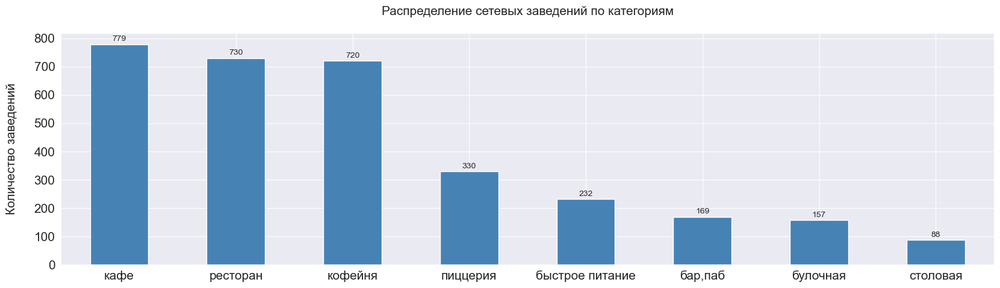

In [21]:
barplot(
        chain_objects,
        chain_objects['category'],
        chain_objects['name'],
        'Распределение сетевых заведений по категориям\n',
        'Количество заведений\n'
)

Среди сетевых заведений больше кафе, ресторанов и кофеен.  
Посмотрим, как соотносятся между собой сетевые заведения и несетевые по категориям.

In [22]:
non_chain_objects = data.query('chain == 0').pivot_table(index='category', values='name', aggfunc='count')\
                                .sort_values(by='name', ascending=False).reset_index()
merge_data = non_chain_objects.merge(chain_objects, on='category')
merge_data.columns = ['category', 'non_chain', 'chain']
merge_data['ratio'] = round(merge_data['chain'] / merge_data['non_chain'], 2)
merge_data.sort_values(by='ratio', ascending=False)

,category,non_chain,chain,ratio
7,булочная,99,157,1.59
5,пиццерия,303,330,1.09
2,кофейня,693,720,1.04
4,быстрое питание,371,232,0.63
1,ресторан,1313,730,0.56
0,кафе,1599,779,0.49
6,столовая,227,88,0.39
3,"бар,паб",596,169,0.28


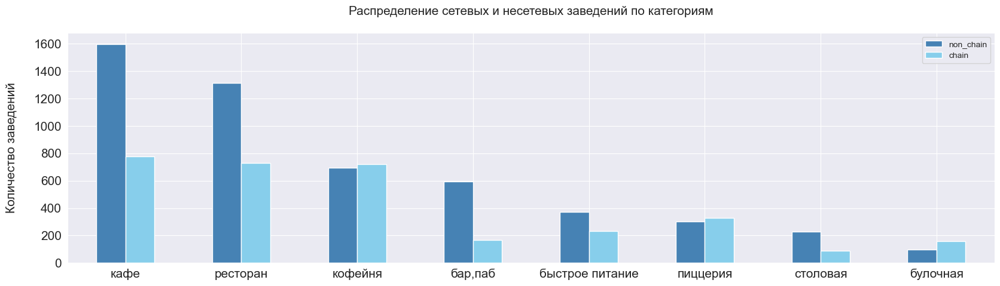

In [23]:
ax = merge_data.drop(columns = 'ratio').plot(kind='bar', figsize=(20, 5), color=['steelblue', 'skyblue'], rot=0, fontsize=15)
ax.set_title('Распределение сетевых и несетевых заведений по категориям\n', fontsize=15)
ax.set_xlabel('')
ax.set_ylabel('Количество заведений\n', fontsize=15)
ax.set_xticklabels(merge_data['category'])
ax.get_legend()
plt.show()

По этой диаграмме видно, что чаще сетевыми становятся кофейни, пиццерии и булочные: сетевых заведений в этих категориях больше, чем несетевых.

### Топ-15 популярных сетей в Москве

In [24]:
data_by_name = data.query('chain == 1').pivot_table(index='name', values='category', aggfunc='count')\
                   .reset_index()\
                   .rename({'name':'name', 'category':'number'}, axis=1)\
                   .sort_values(by='number', ascending=False)\
                   .head(15)
data_by_name

,name,number
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


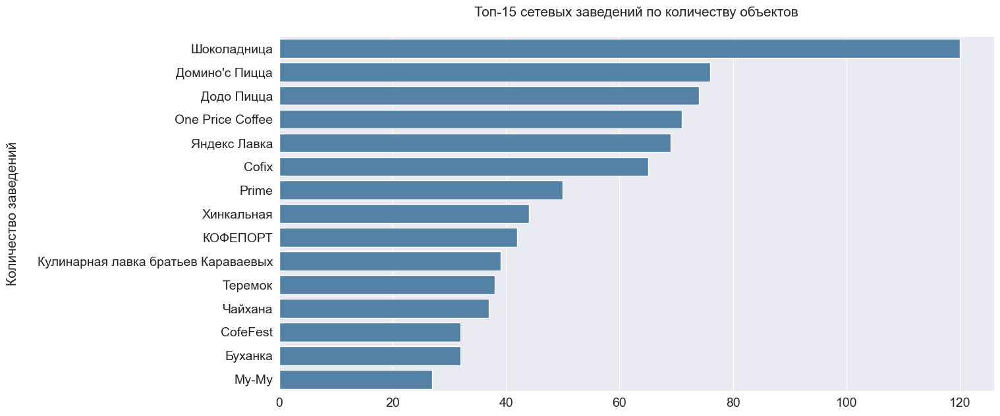

In [25]:
def horizontal_hist(data, x, y, title, ylabel):
    plt.figure(figsize=(14, 7))
    ax = sns.barplot(data=data, x=x, y=y, orient='h', color='steelblue')
    ax.set_title(title, fontsize=15)
    ax.set_xlabel('')
    ax.set_ylabel(ylabel, fontsize=15)
    ax.tick_params(labelsize=14)
    plt.show()

horizontal_hist(
                data_by_name,
                'number',
                'name',
                'Топ-15 сетевых заведений по количеству объектов\n',
                'Количество заведений\n'
                 )

В список попали все достаточно известные сети.  
Проанализируем, какой признак их объединяет.

In [26]:
chain_list = list(data_by_name['name'])
data.query('name in @chain_list').describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,816.000000,816.000000,816.000000,253.000000,138.000000,816.0,529.000000
mean,55.748498,37.605119,4.144608,471.557312,170.615942,1.0,109.720227
std,0.073829,0.101372,0.334621,246.131550,148.934822,0.0,125.680003
min,55.581429,37.379940,1.700000,150.000000,60.000000,1.0,0.000000
25%,55.695250,37.528356,4.100000,344.000000,82.500000,1.0,40.000000
50%,55.754792,37.601655,4.200000,415.000000,97.500000,1.0,75.000000
75%,55.795840,37.662660,4.300000,500.000000,256.000000,1.0,143.000000
max,55.910447,37.863639,4.900000,2250.000000,1568.000000,1.0,1288.000000


In [27]:
data['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Судя по уровню среднеквадратического отклонения (в сравнении со средним значением), топ-15 сетевых заведений объединяет средний рейтинг в районе 4,1-4,2. Но по статистическим характеристикам рейтинга по полному кругу объектов видно, что вариация этого признака в принципе невысокая в датасете.

Далее посмотрим на нечисловые показатели.

In [28]:
data.query('name in @chain_list')['district'].value_counts()

Центральный административный округ         214
Южный административный округ                89
Северный административный округ             88
Западный административный округ             88
Северо-Восточный административный округ     85
Восточный административный округ            80
Юго-Западный административный округ         70
Юго-Восточный административный округ        56
Северо-Западный административный округ      46
Name: district, dtype: int64

In [29]:
data.query('name in @chain_list')['category'].value_counts()

кофейня            336
ресторан           186
пиццерия           151
кафе               100
булочная            25
быстрое питание     12
бар,паб              4
столовая             2
Name: category, dtype: int64

Большая часть заведений относится к категории кофеен, ресторанов, пиццерий и кафе.

In [30]:
data.query('name in @chain_list')['price'].value_counts()

средние          210
низкие            23
выше среднего      6
высокие            2
Name: price, dtype: int64

In [31]:
data.query('name in @chain_list')['is_24/7'].value_counts()

False    759
True      42
Name: is_24/7, dtype: int64

По этим данным видно, что топ-15 сетевых заведений имеют еще два общих признака: в большинстве случаев это средние цены и некруглосуточный режим работы.

***Теперь подробнее проанализируем, как распределены заведения топ-15 по округам***

In [32]:
chain_by_district = data.query('name in @chain_list').pivot_table(
                    index='district', columns='category', values='name', aggfunc='count'
                    )
chain_by_district = chain_by_district.fillna(value=0)
chain_by_district['всего'] = chain_by_district.sum(axis = 1)
chain_by_district = chain_by_district.sort_values(by='всего', ascending=False).reset_index()
chain_by_district

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,всего
0,Центральный административный округ,1.0,1.0,2.0,47.0,94.0,9.0,59.0,1.0,214.0
1,Южный административный округ,0.0,0.0,0.0,4.0,34.0,23.0,28.0,0.0,89.0
2,Западный административный округ,0.0,5.0,1.0,8.0,41.0,15.0,18.0,0.0,88.0
3,Северный административный округ,0.0,8.0,0.0,7.0,40.0,20.0,13.0,0.0,88.0
4,Северо-Восточный административный округ,0.0,6.0,2.0,6.0,37.0,19.0,15.0,0.0,85.0
5,Восточный административный округ,2.0,1.0,2.0,6.0,30.0,20.0,18.0,1.0,80.0
6,Юго-Западный административный округ,1.0,1.0,1.0,9.0,25.0,16.0,17.0,0.0,70.0
7,Юго-Восточный административный округ,0.0,0.0,2.0,12.0,15.0,16.0,11.0,0.0,56.0
8,Северо-Западный административный округ,0.0,3.0,2.0,1.0,20.0,13.0,7.0,0.0,46.0


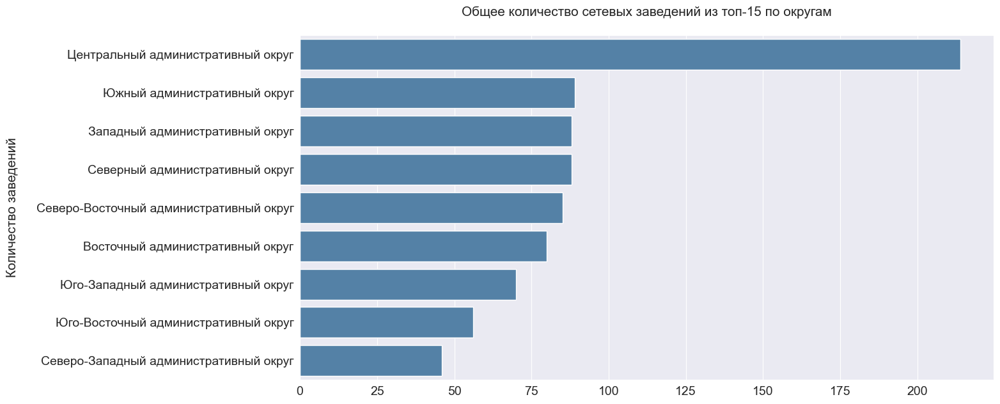

In [33]:
horizontal_hist(
                chain_by_district,
                'всего',
                chain_by_district['district'],
                'Общее количество сетевых заведений из топ-15 по округам\n',
                'Количество заведений\n'
                 )

Логично, что больше всего сетевых заведений сосредоточено в Центральном административном округе.  
Далее заведения одинаково распределены в Южном, Западном и Северном административных округах.  
Незначительно меньше заведений в Северо-Восточном и Восточном административных округам.  
Меньше всего подобных заведений в Северо-Западном административном округе.

In [34]:
chain_by_district = data.query('name in @chain_list')\
                        .pivot_table(index=['district', 'category'], values='name', aggfunc='count')\
                        .reset_index()\
                        .rename({
                                'district':'административный округ',
                                'category':'категория заведения',    
                                'name':'количество заведений'}, axis=1)

In [35]:
fig = px.bar(chain_by_district, x='административный округ', y='количество заведений',
             color='категория заведения', text='количество заведений',
             title='Распределение сетевых заведений из топ-15 по округам и категориям')
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

Во всех округах больше всего представлено сетевых кофеен.  
В Центральном административном округе помимо кофеен расположено большое количество сетевых ресторанов и кафе. В остальных административных округах над сетевыми кафе превалируют сетевые пиццерии.

### Общее распределение заведений по категориям по районам

Мы уже рассмотрели, как распределены заведения крупных сетей по категориям и районам. Теперь посмотрим на это распределение по полному кругу заведений.  
В датасете представлены те же административные округа, которые мы рассматривали ранее.

In [36]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [37]:
data_by_district = data.pivot_table(index=['category', 'district'], values='name', aggfunc='count')\
                        .reset_index()\
                        .rename({
                                'category':'категория заведения',
                                'district':'административный округ',
                                'name':'количество заведений'}, axis=1)\
                        .sort_values(by=['количество заведений'], ascending=False)

In [38]:
fig = px.bar(data_by_district, x='административный округ', y='количество заведений',
             color='категория заведения', text='количество заведений',
             title='Распределение всех заведений по округам и категориям'
            )
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

По диаграмме видно, что ситуация по полному кругу заведений немного отличается в разрезе округов в отличие от сетей. В Центральном административном округе на первое место выходят рестораны, а в остальных округах - кафе.  
Кофейни, которые в сетевых заведениях были на первом месте, теперь находятся на третьем по количеству заведений.  
Также по диаграмме можно заметить, что в Центральном федеральной округе сосредоточено больше всего баров и пабов.

### Распределение средних рейтингов по категориям заведений

In [39]:
rating = data.groupby('category')['rating'].median().reset_index().sort_values(by='rating', ascending=False)
rating

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


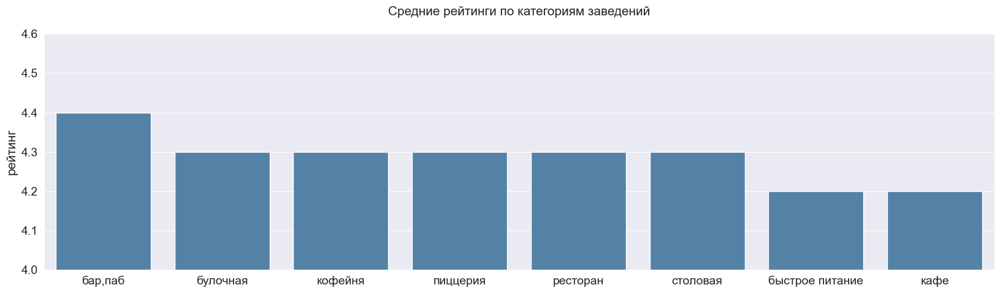

In [40]:
plt.figure(figsize=(20, 5))
ax = sns.barplot(x='category', y='rating', data=rating, order=rating['category'], color='steelblue')
ax.set_title('Средние рейтинги по категориям заведений\n', fontsize=15)
ax.set_xlabel('')
ax.set_ylabel('рейтинг', fontsize=15)
ax.set_ylim(4, 4.6)
ax.tick_params(labelsize=14)
plt.show()

Как видно по графику, наибольшими рейтингами обладали бары и пабы с медианным рейтингом около 4,4.  
Наименьшие рейтинги получали заведения быстрого питания и кафе, в которых медианный рейтинг составил 4,2.

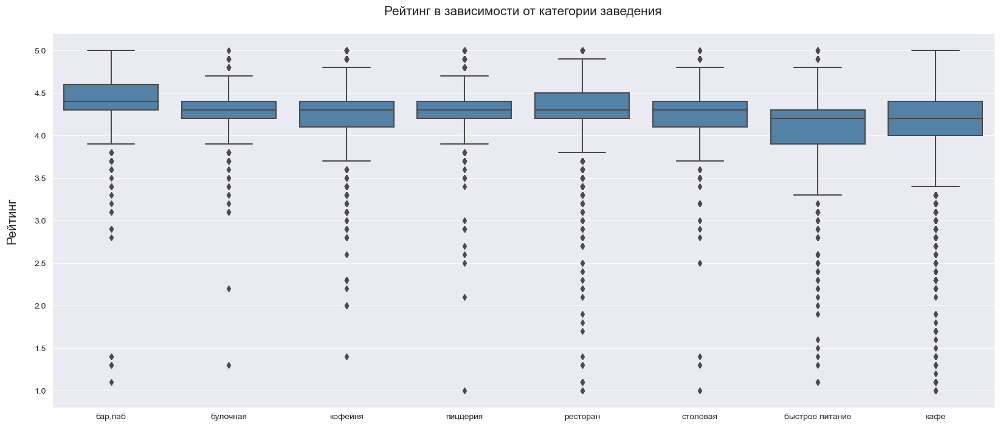

In [41]:
grouped = data.loc[:,['category', 'rating']]\
    .groupby(['category'])\
    .median()\
    .sort_values(by='rating', ascending=False)

plt.figure(figsize=(20, 8))
ax = sns.boxplot(x='category', y='rating', data=data, color='steelblue', order=grouped.index)
ax.set_title('Рейтинг в зависимости от категории заведения\n', fontsize=15)
ax.set_xlabel('')
ax.set_ylabel('Рейтинг\n', fontsize=15)
plt.show()

Количество выбросов с рейтингом менее 3 заметно больше в заведениях категорий кафе, ресторанов и быстрого питания. Это говорит о достаточно сильной неоднородности этих заведений по рейтингу, а, следовательно, и по качеству этих заведений.

### Фоновая картограмму со средним рейтингом заведений каждого района

Сначала рассчитаем средний рейтинг для каждого района. В качестве статистики для определения этой характеристики будем использовать медиану, чтобы нивелировать влияние возможных выбросов.

In [42]:
rating_by_district = data.pivot_table(index='district', values='rating', aggfunc='median').reset_index()
rating_by_district

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [43]:
try: 
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson' 
     
except: 
    state_geo = 'datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423
m_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rating_by_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m_rating)

m_rating

По карте видно, что наибольшим рейтингом обладают заведения Центрального административного округа.

### Карта заведений общественного питания Москвы

In [44]:
m_all = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m_all)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m_all

### Топ-15 улиц по количеству заведений и их распределение по категориям

Сначала найдем топ-15 улиц по количеству заведений.

In [45]:
data_by_street = data.pivot_table(index='street', values='name', aggfunc='count')\
                   .reset_index()\
                   .sort_values(by='name', ascending=False)\
                   .head(15)
data_by_street

,street,name
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


Запомним список этих улиц.

In [46]:
street_list = list(data_by_street['street'])

Теперь добавим к таблице информацию о категориях заведений на этих улицах и построим распределение.

In [47]:
data_by_street = data.query('street in @street_list')\
                     .pivot_table(index=['street', 'category'], values='name', aggfunc='count')\
                     .sort_values(by='name', ascending=False)\
                     .reset_index()\
                     .rename({
                              'street':'улицы',
                              'category':'категория',
                              'name': 'количество заведений'
                              }, axis=1)\
                     

data_by_street['улицы'] = pd.Categorical(data_by_street['улицы'], street_list)

data_by_street=data_by_street.sort_values(by='улицы')

fig = px.bar(
             data_by_street, x='улицы', y='количество заведений',
             color='категория', text='количество заведений',
             title='Распределение заведений по улицам и категориям'
            )

fig.show()

Больше всего заведений расположено на проспекте Мира. Среди категорий заведений наиболее популярными оказались кафе, далее - рестораны, на третьем месте - кофейни. Эти же категории заведений популярны на большинстве остальных улиц.  
На диаграмме выделяется распределение по категориям заведений на МКАД: здесь видно большее количество кафе в соотношении с другими заведениями.  
Также стоит отметить Ленинградский проспект, на которым больше всего расположено баров и пабов.

### Улицы, на которых находится только один объект общепита

In [48]:
one_object = data.pivot_table(index='street', values='name', aggfunc='count').query('name == 1').reset_index()
list_street_one = list(one_object['street'])
print('Количество улиц, на которых находится один объект:', len(list_street_one))

Количество улиц, на которых находится один объект: 458


In [49]:
m_one_object = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m_one_object)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.query('street in @list_street_one').apply(create_clusters, axis=1)

m_one_object

Какой-то районированной закономерности по улицам, на которых расположено по одному объекту, здесь не видно. Их распределение схоже с общим распределением заведений по районам.  
Единственное, что можно заметить: эти объекты располагаются на непротяженных улицах: в переулках, тупиках, проездах и парках. Так что надеяться на отсутствие здесь конкурентов нельзя.

Теперь проанализируем числовые показатели по этим объектам. Может быть, их еще что-то объединяет.

In [50]:
data.query('street in @list_street_one').describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,458.000000,458.000000,458.000000,165.000000,24.000000,458.000000,156.000000
mean,55.760131,37.617146,4.236681,959.830303,186.166667,0.290393,59.115385
std,0.063903,0.093523,0.461952,999.518083,55.544472,0.454440,48.274880
min,55.578830,37.387459,1.000000,67.000000,95.000000,0.000000,0.000000
25%,55.729272,37.561486,4.100000,325.000000,140.000000,0.000000,30.000000
50%,55.760801,37.612995,4.300000,625.000000,177.500000,0.000000,45.000000
75%,55.795678,37.667302,4.500000,1250.000000,213.750000,1.000000,80.000000
max,55.914074,37.867004,5.000000,7000.000000,320.000000,1.000000,240.000000


Здесь не видно, каких-то объединяющий признаков.  
Проанализируем нечисловые показатели.

In [51]:
data.query('street in @list_street_one')['chain'].value_counts()

0    325
1    133
Name: chain, dtype: int64

In [52]:
data.query('street in @list_street_one')['category'].value_counts()

кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

In [53]:
data.query('street in @list_street_one')['is_24/7'].value_counts()

False    400
True      31
Name: is_24/7, dtype: int64

In [54]:
data.query('street in @list_street_one')['price'].value_counts()

средние          120
выше среднего     29
высокие           22
низкие            11
Name: price, dtype: int64

In [55]:
data.query('street in @list_street_one')['avg_bill'].value_counts()

Средний счёт:1000–1500 ₽         10
Средний счёт:1500–2000 ₽          8
Средний счёт:200–300 ₽            8
Средний счёт:1500 ₽               6
Средний счёт:1000 ₽               4
                                 ..
Цена чашки капучино:130–230 ₽     1
Средний счёт:35–100 ₽             1
Цена чашки капучино:185–285 ₽     1
Цена чашки капучино:120–150 ₽     1
Цена чашки капучино:от 170 ₽      1
Name: avg_bill, Length: 125, dtype: int64

In [56]:
data.query('street in @list_street_one')['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Северный административный округ             52
Восточный административный округ            52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

По категориальным показателям видно, что в целом эти объекты имеют те же средние характеристики, что полный круг объектов.  
Таким образом, можно предположить, что эти объекты отличаются только тем, что находятся на непротяженных улицах.

### Анализ средних чеков в разрезе округов

In [57]:
bills_by_district = data.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index()
bills_by_district.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [58]:
m_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=bills_by_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная стоимость заказа по районам',
).add_to(m_bill)

m_bill

По карте видно, что наиболее высокий средний чек в Центральной Западном административных округах.  
Самый низкий средний чек в Северо-Восточном, Южном, Юго-Восточном административных округах.  
Посмотрим на репрезентативность данных, поскольку мы помним, что по этому столбцу было много пропусков.

In [59]:
bills_by_district2 = data.groupby('district', as_index=False)['middle_avg_bill'].count()
bills_by_district2.columns = ['district', 'count']
bills_by_district = bills_by_district.merge(bills_by_district2, on='district')
bills_by_district['percent_of_8406'] = bills_by_district['count'] * 100 / data.shape[0]
bills_by_district.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill,count,percent_of_8406
1,Западный административный округ,1000.0,306,3.640257
5,Центральный административный округ,1000.0,1060,12.610040
4,Северо-Западный административный округ,700.0,157,1.867714
2,Северный административный округ,650.0,322,3.830597
7,Юго-Западный административный округ,600.0,235,2.795622
0,Восточный административный округ,575.0,260,3.093029
3,Северо-Восточный административный округ,500.0,301,3.580776
8,Южный административный округ,500.0,314,3.735427
6,Юго-Восточный административный округ,450.0,194,2.307875


Судя по количеству заведений, попавших в анализ по каждому району, с уверенностью о среднем чеке можно судить только по Центральному административному округу.  
Попробуем сравнить центр с остальными районами для достоверности выводов.  
Посчитаем средний чек по всем районам, кроме Центрального.

In [60]:
print(
      'Медианный чек по районам, кроме Центрального, равен:',
       data.query('not district == "Центральный административный округ"')['middle_avg_bill'].median(),
      'рублей'
     )

Медианный чек по районам, кроме Центрального, равен: 600.0 рублей


Теперь можно сделать вывод о том, что в центре средний чек выше, чем в других районах.

### Выводы по разделу

**По результатам анализа были получены следующие выводы:**

1. Наибольшее количество заведений представлено в категории кафе (28,3%), ресторан (24,3%) и кофейня (16,8%). На остальные категории приходится чуть более 30% заведений.  


2. По количеству посадочных мест первое место занимают рестораны, в половине которых посадочных место более 86. Далее идут бары и пабы (83 места) и кофейни (80 мест). Меньше всего посадочных мест к кафе (60 мест), пиццериях (55 мест) и булочных (50 мест).


3. Доля сетевых заведений в Москве составляет 38%. Среди сетевых заведений больше всего кафе, ресторанов и кофеен.  При этом, чаще сетевыми становятся кофейни, пиццерии и булочные: сетевых заведений в этих категориях больше, чем несетевых.  


4.  Топ-15 сетевых заведений выглядит следующим образом: Шоколадница, Домино'с Пицца, Додо Пицца, One Price Coffee, Яндекс Лавка, Cofix, Prime, Хинкальная, КОФЕПОРТ, Кулинарная лавка братьев Караваевых, Теремок, Чайхана, CofeFest, Буханка, Му-Му.
Эти заведения имеют следующие характеристики:
- Средний рейтинг сетевых заведений из топ- 15 составляет 4,14.
- Большая часть этих заведений относится к категории кофеен, ресторанов, пиццерий и кафе.
- В большинстве случаев в этих заведениях установлены средние цены и некруглосуточный режим работы.
- Больше всего сетевых заведений сосредоточено в Центральном административном округе.
- Во всех округах больше всего представлено сетевых кофеен.  


5. Анализ распределения категорий заведений по округам показал, что в Центральном административном округе больше всего представлено ресторанов, в остальных округах - кафе. На втором месте почти во всех округах по количеству заведений находятся рестораны, на третьем – кофейни. Также можно отметить, что в Центральном федеральной округе сосредоточено больше всего баров и пабов.  


6. Наибольшими рейтингами обладали бары и пабы с медианным рейтингом около 4,4. Наименьшие рейтинги получали заведения быстрого питания и кафе, в которых медианный рейтинг составил 4,2.  


7. Наибольшим рейтингом обладают заведения Центрального административного округа.  


8. Топ-15 улиц с наибольшим количеством заведений выглядит следующим образом: проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспек, Ленинградский проспект, Дмитровское шоссе, Каширское шоссе, Варшавское шоссе, Ленинградское шоссе, МКАД, Люблинская улица, улица Вавилова, Кутузовский проспект, улица Миклухо-Маклая, Пятницкая улица.
Больше всего заведений расположено на проспекте Мира. Среди категорий заведений наиболее популярными оказались кафе, далее - рестораны, на третьем месте - кофейни. Эти же категории заведений популярны на большинстве остальных улиц.
Среди всего улиц из топ-15 наиболее выделяется распределение по категориям заведений на МКАД: здесь видно большее количество кафе в соотношении с другими заведениями.
Также стоит отметить Ленинградский проспект, на которым больше всего расположено баров и пабов.  


9. Проанализировав улицы, на которых расположено по одному заведения, был сделан вывод, что это непротяженные улицы такие, как переулки, тупики, проезды, парки и т.д. Это единственный признак, который объединяет эти объекты.  


10. Анализ средних чеков показал, что в центре этот показатель выше, чем в других районах (1000 рублей против 600 рублей).

## Детализация исследования по кофейням

### Количество кофеен всего и по районам

In [61]:
print(
      'Всего кофеен в датасете:',
      data.query('category == "кофейня"')['name'].count()
      )

Всего кофеен в датасете: 1413


In [62]:
coffee_house_by_district = data.query('category == "кофейня"').pivot_table(
                    index='district', values='name', aggfunc='count'
                    ).sort_values(by='name', ascending=False)\
                    .reset_index()
coffee_house_by_district

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


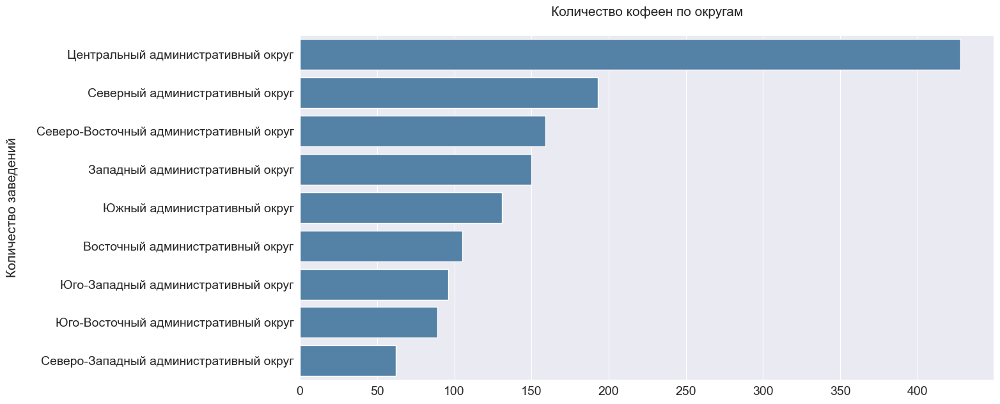

In [63]:
horizontal_hist(
                coffee_house_by_district,
                'name',
                'district',
                'Количество кофеен по округам\n',
                'Количество заведений\n'
                 )

Распределение кофеен по округам соответствует общему распределению заведений по полному кругу категорий:
- в Центральном административном округе больше всего расположено кофеен, как и в целом заведений общественного питания;
- В Северо-Западном административном округе меньше всего кофеен, как и заведений в целом.

### Анализ круглосуточных кофеен

In [64]:
print(
      'Всего круглосуточных кофеен в датасете:',
      data[(data['category'] == "кофейня") & (data['is_24/7'] == True)]['name'].count()
      )

Всего круглосуточных кофеен в датасете: 59


In [65]:
coffee_house_around = data[(data['category'] == "кофейня") & (data['is_24/7'] == True)].pivot_table(
                    index='district', values='name', aggfunc='count'
                    ).sort_values(by='name', ascending=False)\
                    .reset_index()
coffee_house_around

,district,name
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


В основном круглосуточные кофейни расположены в Центральном административном округе.

### Средние рейтинги кофеен по полному кругу и по районам

In [66]:
print('Статистика по рейтингам кофеен')
data.query('category == "кофейня"')['rating'].describe()

Статистика по рейтингам кофеен


count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

In [67]:
print('Статистика по рейтингам всех заведений')
data['rating'].describe()

Статистика по рейтингам всех заведений


count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Средний и медианный рейтинг кофеен составляет 4.3, что соответствует среднему рейтингу по полному кругу заведений.

In [68]:
coffee_house_rating = data.query('category == "кофейня"')\
                          .pivot_table(index='district', values='rating', aggfunc='median')\
                          .reset_index()
coffee_house_rating.sort_values(by='rating', ascending=False)

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


Почти по всем округам медианный рейтинг составляет 4,3. Исключение составляет Западный административный округ, в котором рейтинг совсем немного ниже - 4,2.

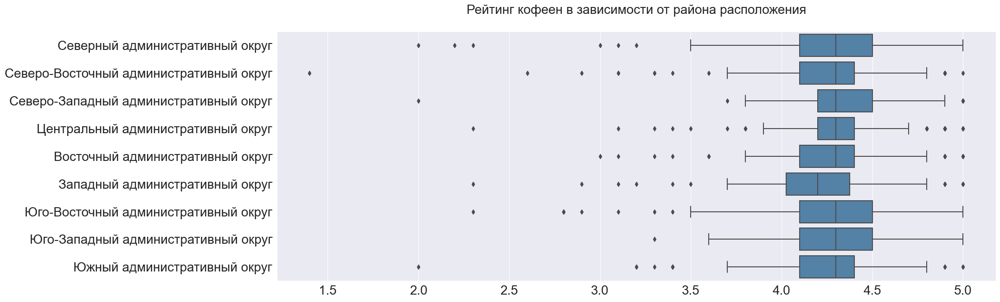

In [69]:
plt.figure(figsize=(20, 7))
ax = sns.boxplot(x='rating', y='district', data=data.query('category == "кофейня"'), color='steelblue', orient='h')
ax.set_title('Рейтинг кофеен в зависимости от района расположения\n', fontsize=20)
ax.set_xlabel('')
ax.set_ylabel('')
ax.tick_params(labelsize=20)

plt.show()

Выбросов по рейтингам среди кофеен не так много. Особенно показателен Центральный административный округ, который является самым репрезентативным. По нему мы видим всего 10 выбросов в обе стороны при общем количестве в 428 кофеен. Поэтому о средней ситуации с рейтингами мы вполне можем судить по медианным и квартильным значениям.

### Средняя стоимость чашки капучино

In [70]:
print('Статистика по стоимости средней чашки капучино')
data.query('category == "кофейня"')['middle_coffee_cup'].describe()

Статистика по стоимости средней чашки капучино


count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [71]:
print(
      'Коэффициент вариации:{:.2%}'.format(
       np.std(data.query('category == "кофейня"')['middle_coffee_cup'])
        / data.query('category == "кофейня"')['middle_coffee_cup'].mean()
        )
      )

Коэффициент вариации:51.22%


Медианная стоимость чашки капучино составляет 170 рублей. Вариация признака достаточно большая (более 50%), что говорит о неоднородности цен на капучино в кофейнях.  
Посмотрим, как на эту неоднородность влияет территориальное расположение кофеен.

In [72]:
middle_coffee_cup = data.query('category == "кофейня"')\
                    .pivot_table(index='district', values='middle_coffee_cup', aggfunc='median')\
                    .reset_index()
middle_coffee_cup.sort_values(by='middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [73]:
m_coffee_cup = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=middle_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная стоимость заказа по районам',
).add_to(m_coffee_cup)

m_coffee_cup

In [74]:
middle_coffee_cup2 = data.query('category == "кофейня"').groupby('district', as_index=False)['middle_coffee_cup'].count()
middle_coffee_cup2.columns = ['district', 'count']
middle_coffee_cup2.sort_values(by='count', ascending=False)

,district,count
5,Центральный административный округ,162
2,Северный административный округ,76
3,Северо-Восточный административный округ,60
1,Западный административный округ,49
8,Южный административный округ,43
0,Восточный административный округ,42
6,Юго-Восточный административный округ,34
7,Юго-Западный административный округ,34
4,Северо-Западный административный округ,21


В центре и к западу цены на чашку капучино выше, чем в других местах. Но помня о слабой репрезентативности данных в нецентральных округах, проанализируем укрупненно по ним среднюю цену на чашку капучино.

In [75]:
print(
      'Медианный чек по районам, кроме Центрального, равен:',
       data[(data['category'] == "кофейня")
            & (data['district'] != "Центральный административный округ")]['middle_coffee_cup'].median(),
      'рублей'
     )

Медианный чек по районам, кроме Центрального, равен: 159.0 рублей


Теперь с уверенностью можно говорить о том, что в Центральном административном округе средняя цена чашки капучино выше, чем в остальных округах.

### Вывод по разделу

В результате детализованного анализа по кофейням были сделаны выводы:

1. По количеству заведений в Москве кофейни занимают третье место (16,8% от числа всех заведений).


2. Средний и медианный рейтинг кофеен составляет 4.3, что соответствует среднему рейтингу по полному кругу заведений.


3. Почти по всем округам медианный рейтинг составляет 4,3. Исключение составляет Западный административный округ, в котором рейтинг совсем немного ниже - 4,2.


4. Медианная стоимость чашки капучино составляет 170 рублей. Вариация признака достаточно большая (более 50%), что говорит о неоднородности цен на капучино в кофейнях.  


5. В центре и к западу цены на чашку капучино выше, чем в других районах (190 рублей против 159 рублей). 


***Рекомендации по открытию кофейни:***
1. Относительно района расположения:
Самая высокая конкуренция может быть в Центральном округе из-за большого количества заведений. Но у этого округа есть преимущество в виде большого трафика и высоких цен. Минусом также будет являться высокая аренда. Поэтому сюда стоит идти только с максимально сильным проектом.
В Западном округе большое количество сетевых заведений (из 49 кофеен 41 сетевая). Это тоже увеличивает конкуренцию, поскольку сети стабильно обладают высокой популярностью.
По соотношению цены и уровня конкуренции выгодно выглядит Юго-Западный округ. Здесь немного кофеен (всего 34 заведения), но средняя цена чашки капучино самая высокая (198 рублей).

2. Относительно режима работы:
Из-за того, что в Москве мало круглосуточных кофеен, можно предположить, что они не востребованы. Поэтому от такого  режима работы можно отказаться, если инвесторы не готовы рисковать и использовать это в качестве особенности заведения.

3. Относительно стоимости чашки капучино:
В зависимости от выбранного района расположения кофейни стоит ориентироваться на медианную или среднюю цену. Хотя это будет зависеть от используемого маркетингового плана компании.

В целом, стоит отметить, что этих данных недостаточно для принятия решения об открытии заведения. Стоит провести анализ дополнительный показателей, например, трафика, стоимости аренды и т.д.

## Презентация

Презентация: <https://disk.yandex.ru/i/qzYoxIS2hmtdKA> 